# Mask R-CNN - Inspect Balloon Training Data

Inspect and visualize data loading and pre-processing code.

In [12]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.balloon import balloon

%matplotlib inline 

## Configurations

Configurations are defined in balloon.py

In [13]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/balloon")

## Dataset

In [14]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 61
Class Count: 2
  0. BG                                                
  1. balloon                                           


## Display Samples

Load and display images and masks.

[1249 1250 1250 ... 1732 1732 1733]
[377 366 367 ... 356 357 346]


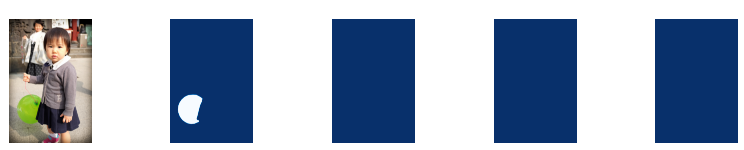

[  0   2   3 ... 246 246 247]
[565 566 566 ... 488 489 487]
[  1   1   1 ... 204 204 205]
[361 362 363 ... 471 472 470]
[ 96  97  97 ... 367 367 367]
[339 334 335 ... 400 401 402]


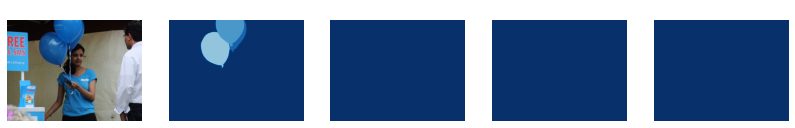

[  2   3   3 ... 350 350 350]
[1257 1257 1258 ... 1422 1423 1424]
[302 302 302 ... 654 654 655]
[1133 1134 1135 ... 1100 1101 1100]
[  1   2   2 ... 546 546 547]
[  1   2   3 ... 101 102 101]


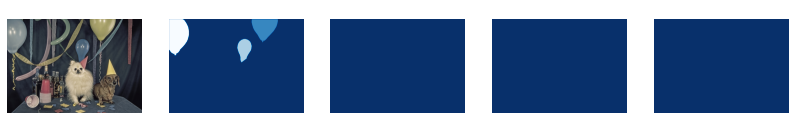

[115 116 116 ... 964 964 965]
[441 437 438 ... 506 507 506]


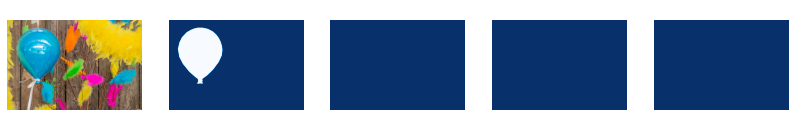

In [16]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

## Bounding Boxes

Rather than using bounding box coordinates provided by the source datasets, we compute the bounding boxes from masks instead. This allows us to handle bounding boxes consistently regardless of the source dataset, and it also makes it easier to resize, rotate, or crop images because we simply generate the bounding boxes from the updates masks rather than computing bounding box transformation for each type of image transformation.

[ 610  611  611 ... 1629 1629 1630]
[1392 1378 1379 ... 1201 1202 1197]
[102 103 103 ... 776 776 777]
[1555 1540 1541 ... 1714 1715 1714]
[ 314  315  315 ... 1165 1166 1167]
[859 840 841 ... 966 966 966]
[ 850  851  851 ... 1919 1919 1920]
[571 558 559 ... 628 629 628]
[1239 1242 1243 ... 1857 1857 1857]
[982 983 983 ... 869 870 871]
image_id  16 /home/hqyone/mnt/2tb/hunnu/lxg/code/mask_rcnn_2/Mask_RCNN/datasets/balloon/train/10464445726_6f1e3bbe6a_k.jpg
image                    shape: (2019, 2048, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (2019, 2048, 5)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (5,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (5, 4)                min:  102.00000  max: 1921.00000  int32


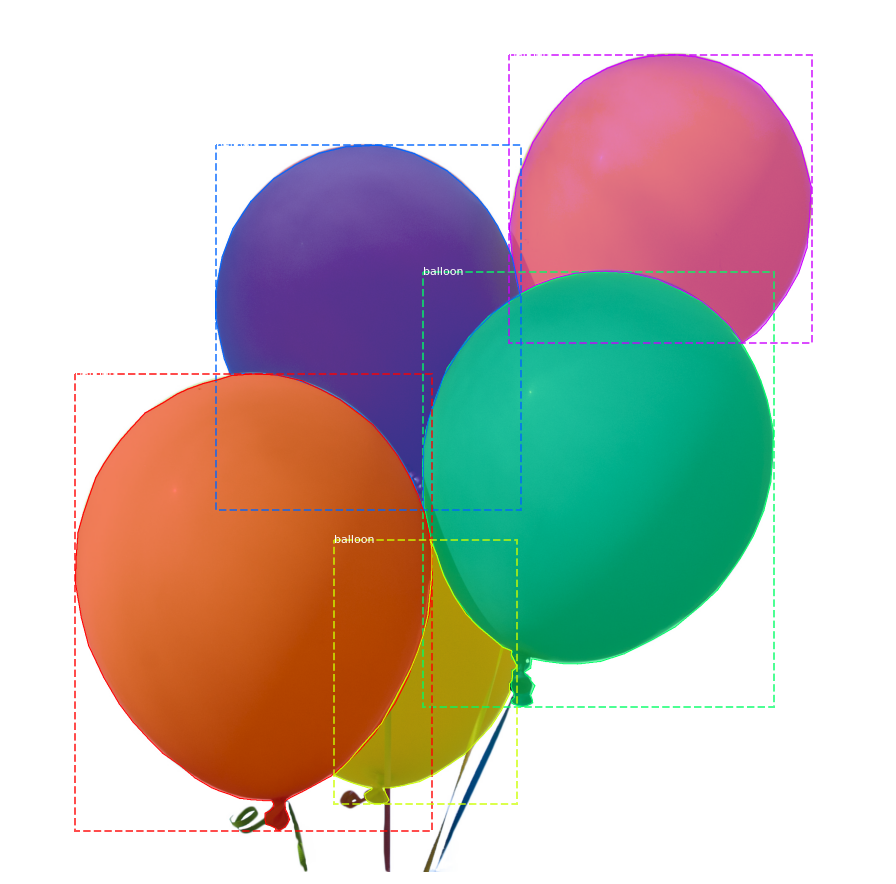

In [17]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Resize Images

To support multiple images per batch, images are resized to one size (1024x1024). Aspect ratio is preserved, though. If an image is not square, then zero padding is added at the top/bottom or right/left.

[  0   1   1 ... 298 298 299]
[649 649 650 ... 707 708 706]
image_id:  11 /home/hqyone/mnt/2tb/hunnu/lxg/code/mask_rcnn_2/Mask_RCNN/datasets/balloon/train/14321263043_b76ef054d3_k.jpg
Original shape:  (1356, 2048, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  174.00000  max:  423.00000  int32


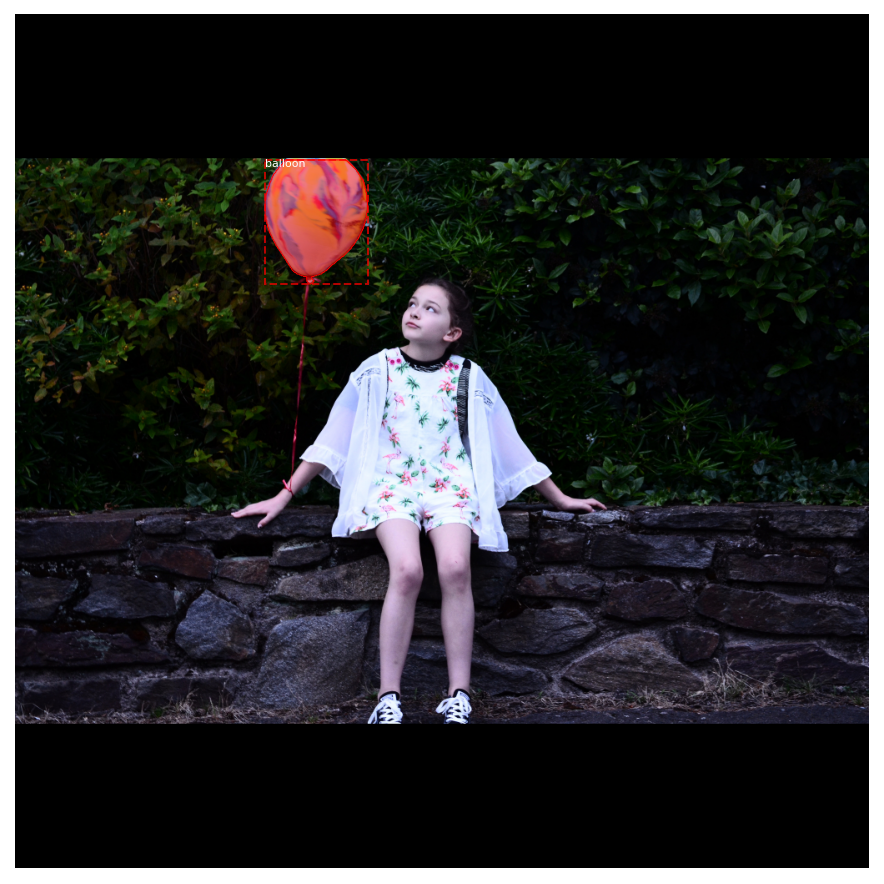

In [18]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Mini Masks

Instance binary masks can get large when training with high resolution images. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (Numpy uses bytes for boolean values). If an image has 100 instances then that's 100MB for the masks alone. 

To improve training speed, we optimize masks by:
* We store mask pixels that are inside the object bounding box, rather than a mask of the full image. Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.
* We resize the mask to a smaller size (e.g. 56x56). For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accuracy to begin with, so this loss is negligable for most practical purposes. Thie size of the mini_mask can be set in the config class.

To visualize the effect of mask resizing, and to verify the code correctness, we visualize some examples.

[358 358 358 ... 631 631 632]
[566 567 568 ... 538 539 538]
[456 457 457 ... 680 680 681]
[415 390 391 ... 420 421 410]
[569 569 569 ... 729 729 730]
[291 292 293 ... 252 253 252]
[713 714 714 ... 936 936 937]
[297 294 295 ... 262 263 262]
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (4,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (4, 4)                min:  337.00000  max:  938.00000  int32
mask                     shape: (56, 56, 4)           min:    0.00000  max:    1.00000  bool


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


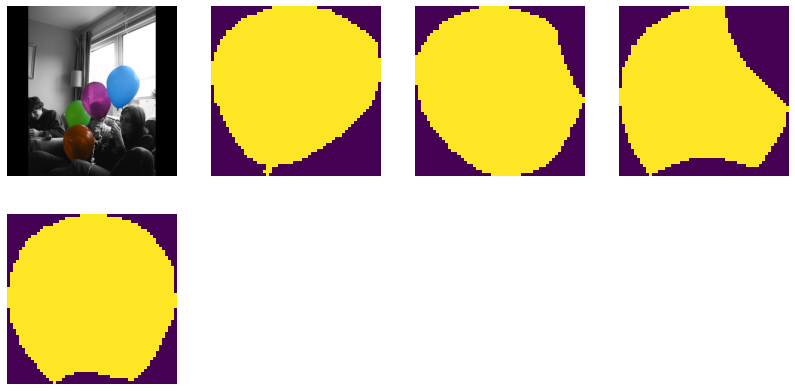

In [19]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

In [20]:
# visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

[358 358 358 ... 631 631 632]
[566 567 568 ... 538 539 538]
[456 457 457 ... 680 680 681]
[415 390 391 ... 420 421 410]
[569 569 569 ... 729 729 730]
[291 292 293 ... 252 253 252]
[713 714 714 ... 936 936 937]
[297 294 295 ... 262 263 262]
mask                     shape: (56, 56, 4)           min:    0.00000  max:    1.00000  bool


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


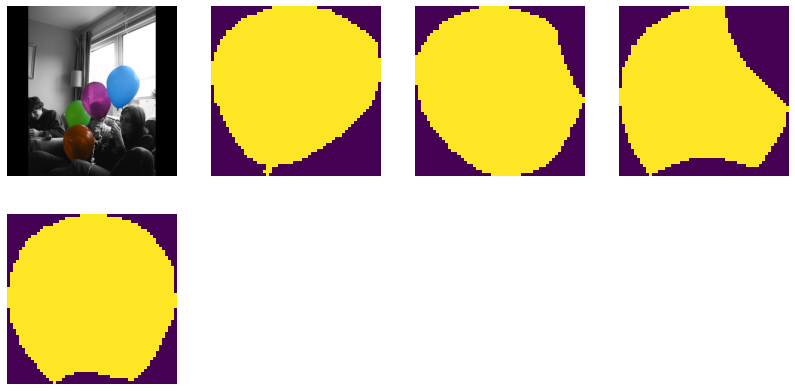

In [21]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

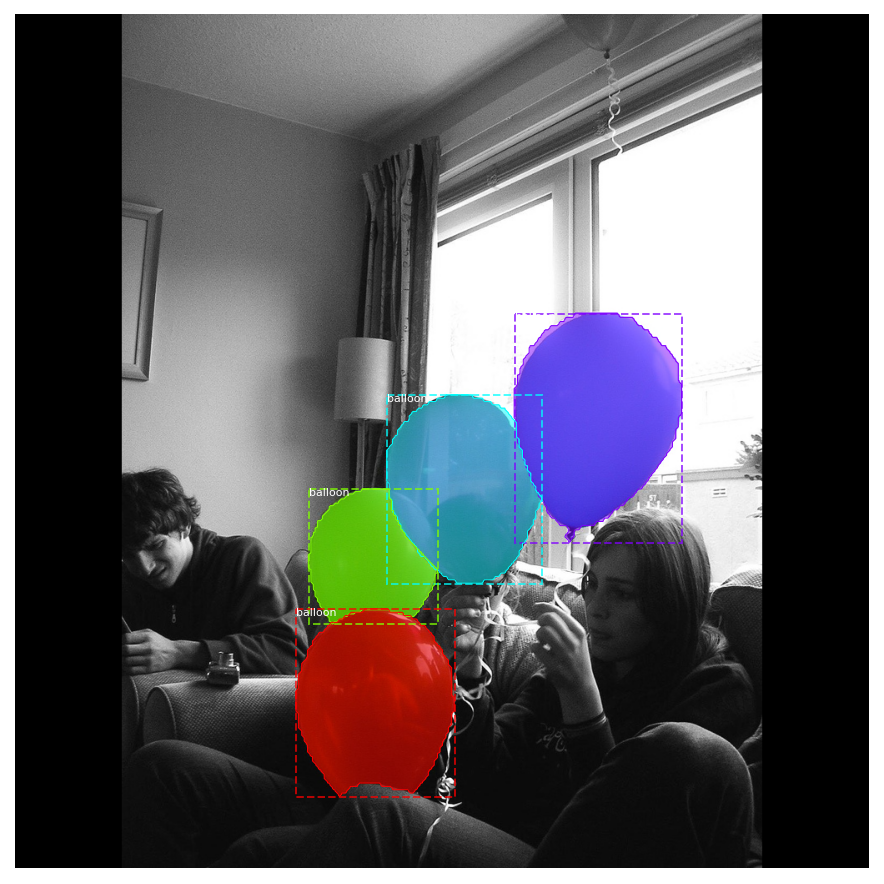

In [22]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Anchors

The order of anchors is important. Use the same order in training and prediction phases. And it must match the order of the convolution execution.

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 

* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

**Anchor Stride:**
In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature meap of the first layer is 256x256, which generates about 200K anchors (256*256*3). These anchors are 32x32 pixels and their stride relative to image pixels is 4 pixels, so there is a lot of overlap. We can reduce the load significantly if we generate anchors for every other cell in the feature map. A stride of 2 will cut the number of anchors by 4, for example. 

In this implementation we use an anchor stride of 2, which is different from the paper.

In [23]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Visualize anchors of one cell at the center of the feature map of a specific level.

[565 566 566 ... 707 707 708]
[593 587 588 ... 612 613 590]
Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


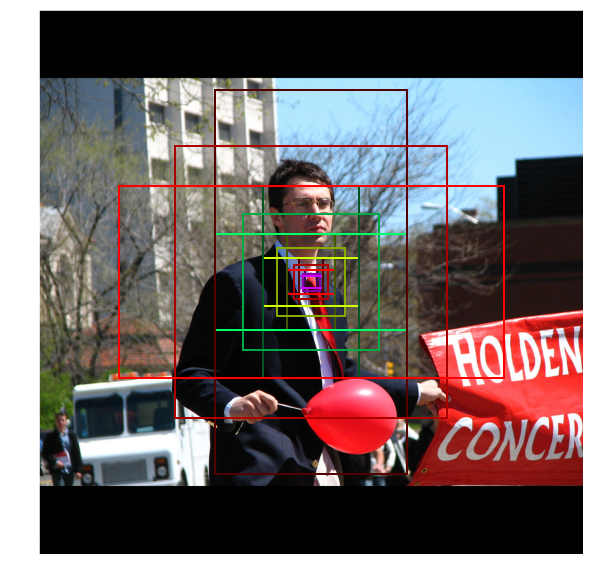

In [24]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


## Data Generator


In [25]:
# Create data generator
random_rois = 2000
g = modellib.DataGenerator(
    dataset, config, shuffle=True, random_rois=random_rois,
    detection_targets=True)

In [26]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [27]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = g[0]
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = g[0]
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

[227 227 227 ... 367 367 367]
[417 418 419 ... 432 433 434]
[604 604 604 ... 669 669 669]
[374 375 376 ... 395 396 397]
[605 606 606 ... 665 665 666]
[468 463 464 ... 476 477 474]
[608 608 608 ... 671 671 671]
[600 601 602 ... 607 608 609]
[ 544  545  545 ... 1024 1024 1024]
[427 420 421 ... 518 519 520]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


IndexError: index 1024 is out of bounds for axis 0 with size 1024

anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (2, 4)                min:  109.00000  max:  792.00000  float32
Positive anchors: 2
Negative anchors: 254
Neutral anchors: 261632
BG                     : 171
balloon                : 29


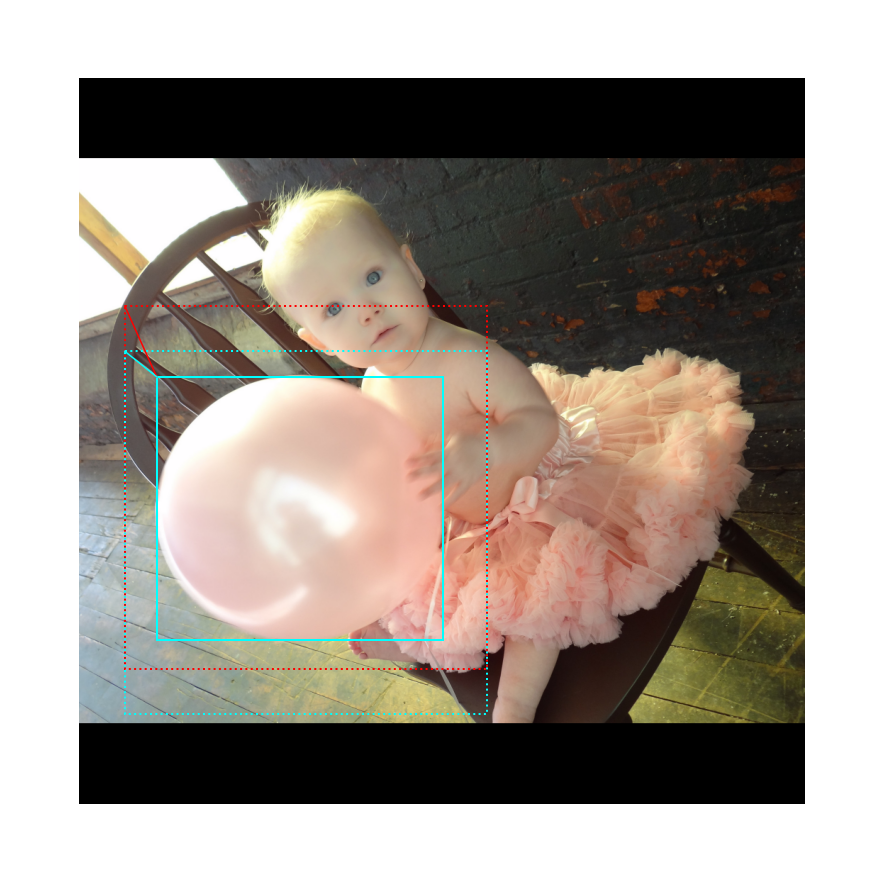

In [ ]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

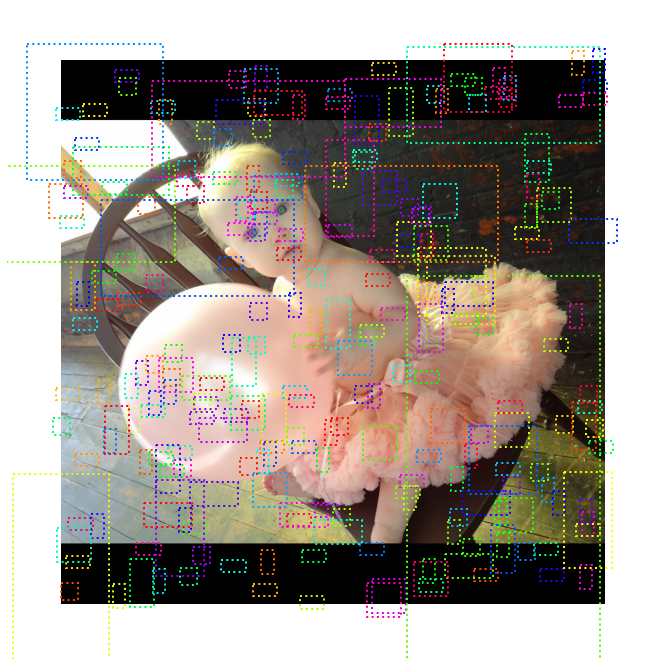

In [ ]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

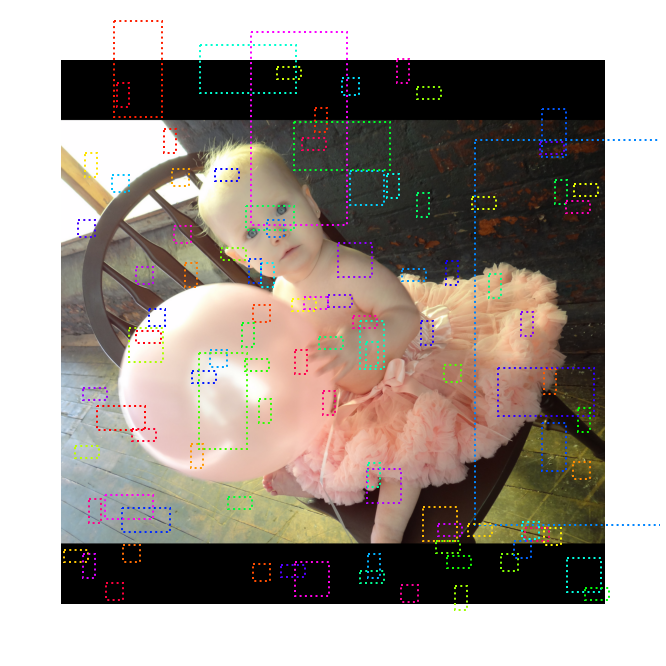

In [ ]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## ROIs

Positive ROIs:  29
Negative ROIs:  171
Positive Ratio: 0.14
Unique ROIs: 200 out of 200


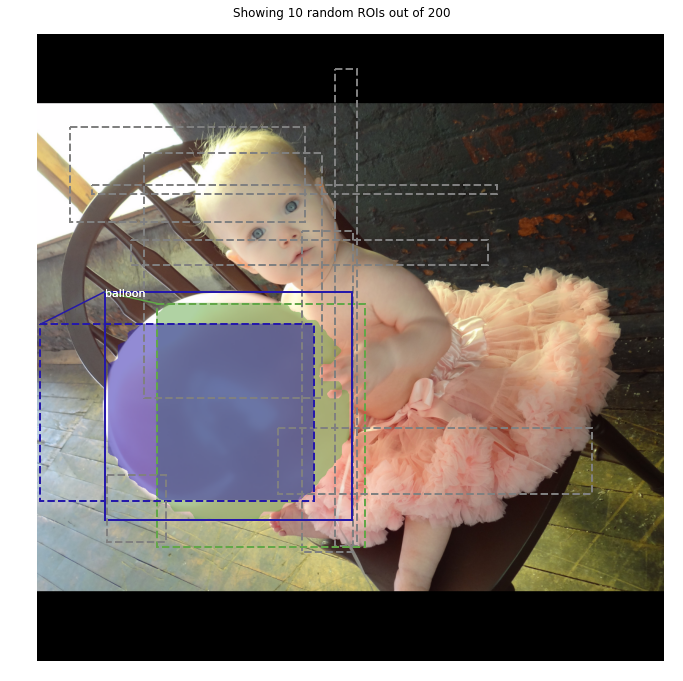

In [51]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

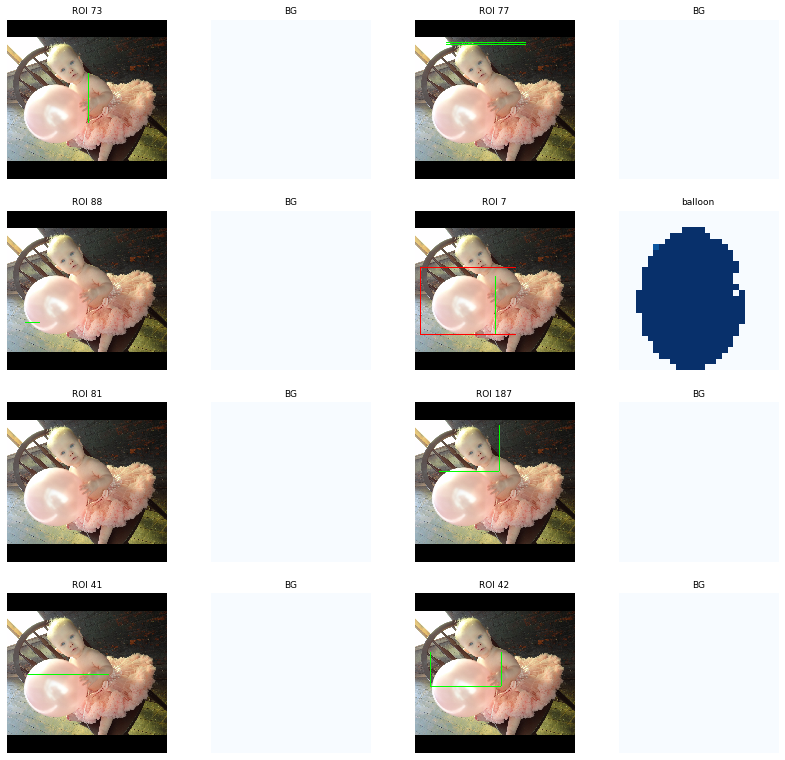

In [ ]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [28]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.DataGenerator(
        dataset, config, shuffle=True, random_rois=10000, 
        detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = temp_g[i]
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

[  2   3   3 ... 350 350 350]
[1257 1257 1258 ... 1422 1423 1424]
[302 302 302 ... 654 654 655]
[1133 1134 1135 ... 1100 1101 1100]
[  1   2   2 ... 546 546 547]
[  1   2   3 ... 101 102 101]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[  0   0   0 ... 294 294 295]
[2 3 4 ... 3 4 2]
[273 274 274 ... 562 562 563]
[82 70 71 ... 90 91 69]
[554 554 554 ... 781 781 781]
[18 19 20 ... 63 64 65]
[764 765 765 ... 986 986 987]
[109 107 108 ...   6   7   1]
[327 328 328 ... 431 431 432]
[192 193 194 ... 261 262 262]
[421 422 422 ... 573 573 574]
[230 230 231 ... 158 159 159]
[726 727 727 ... 990 990 991]
[208 201 202 ... 185 186 172]
[831 832 833 ... 955 955 956]
[332 333 333 ... 288 289 284]
[624 625 625 ... 871 871 872]
[455 455 456 ... 434 435 415]
[466 467 467 ... 756 756 757]
[308 302 303 ... 336 337 335]
[368 369 369 ... 627 627 627]
[515 514 515 ... 535 536 537]
[ 55  55  55 ... 409 409 410]
[438 439 440 ... 388 389 376]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
[243 244 244 ... 989 989 990]
[1020 1015 1016 ... 1052 1053 1048]
[414 415 415 ... 926 926 927]
[1387 1367 1368 ... 1458 1459 1454]
[408 409 409 ... 830 830 831]
[727 725 726 ... 723 724 725]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[533 534 534 ... 800 800 800]
[1102 1075 1076 ... 1106 1107 1108]
   66  0.33


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[243 244 244 ... 989 989 990]
[1020 1015 1016 ... 1052 1053 1048]
[414 415 415 ... 926 926 927]
[1387 1367 1368 ... 1458 1459 1454]
[408 409 409 ... 830 830 831]
[727 725 726 ... 723 724 725]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[468 469 469 ... 669 669 670]
[656 619 620 ... 662 663 663]
[457 458 458 ... 679 679 680]
[828 825 826 ... 868 869 869]
[522 522 523 523 523 523 523 523 523 523 523 523 523 523 523 523 523 523
 524 524 524 524 524 524 524 524 524 524 524 524 524 524 524 524 524 524
 524 524 525 525 525 525 525 525 525 525 525 525 525 525 525 525 525 525
 525 525 526 526 526 526 526 526 526 526 526 526 526 526 526 526 526 526
 526 526 527 527 527 527 527 527 527 527 527 527 527 527 527 527 527 527
 527 528 528 528 528 528 528 528 528 528 528 528 528 528 528 528 528 529
 529 529 529 529 529 529 529 529 529 529 529 529 529 529 530 530 530 530
 530 530 530 530 530 530 530 530 530 530 530 531 531 531 531 531 531 531
 531 531 531 531 531 531 531 532 532 532 532 532 532 532 532 532 532 532
 532 532 532 533 533 533 533 533 533 533 533 533 533 533 533 533 534 534
 534 534 534 534 534 534 534 534 534 534 535 535 535 535 535 535 535 535
 535 535 535 536 536 536 536 536 536 536 536 536 536 536 537 537 537 537
 537

/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
[ 861  862  862 ... 1145 1145 1146]
[328 318 319 ... 342 343 340]
[ 846  846  846 ... 1137 1137 1138]
[473 474 475 ... 487 488 487]
[ 947  948  949 ... 1185 1185 1186]
[604 604 604 ... 519 520 518]
[ 342  343  343 ... 1208 1208 1209]
[869 863 864 ... 849 850 850]
[1007 1007 1007 ... 1427 1427 1427]
[1134 1135 1136 ... 1562 1563 1564]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[478 478 478 ... 612 612 613]
[385 386 387 ... 400 401 398]
[635 636 636 ... 806 806 806]
[477 470 471 ... 468 469 470]
[726 727 727 ... 912 912 913]
[364 346 347 ... 372 373 371]
   66  0.33


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[ 62  63  63 ... 356 356 356]
[302 295 296 ... 324 325 326]
[365 365 365 ... 810 810 811]
[688 689 690 ... 679 680 677]
[457 458 458 ... 803 804 805]
[865 863 864 ... 825 825 825]
[ 619  620  620 ... 1062 1063 1064]
[1021 1010 1011 ...  900  899  898]
[ 803  803  803 ... 1244 1244 1245]
[719 720 721 ... 747 748 746]
[ 991  992  992 ... 1363 1363 1364]
[1023 1022 1023 ...  822  823  823]
[1219 1220 1221 ... 1574 1574 1575]
[710 711 711 ... 701 702 700]
[1122 1123 1123 ... 1496 1496 1496]
[538 534 535 ... 601 602 603]
[ 926  927  928 ... 1133 1133 1134]
[355 355 355 ... 496 497 492]
[ 637  638  638 ... 1047 1047 1048]
[464 431 432 ... 540 541 533]
[522 523 524 ... 829 829 830]
[534 533 532 ... 641 642 641]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
[ 0  1  1 ... 42 42 43]
[652 606 607 ... 637 638 628]
[143 143 143 ... 226 226 226]
[617 618 619 ... 630 631 632]
[134 135 135 ... 233 233 234]
[527 523 524 ... 523 524 509]
[ 84  85  85 ... 150 150 150]
[414 412 413 ... 414 415 416]
[ 1  1  1 ... 53 53 54]
[262 263 264 ... 288 289 279]
[ 0  1  1 ... 37 37 38]
[324 324 325 ... 362 363 361]
[122 123 123 ... 176 176 176]
[ 1  1  2 ... 15 16 17]
[51 51 51 ... 89 89 90]
[74 75 76 ... 81 82 77]
[ 67  68  68  68  68  68  68  69  69  69  69  69  69  69  70  70  70  70
  70  70  70  70  70  71  71  71  71  71  71  71  71  71  71  72  72  72
  72  72  72  72  72  72  72  72  72  73  73  73  73  73  73  73  73  73
  73  73  73  73  74  74  74  74  74  74  74  74  74  74  74  74  74  74
  74  75  75  75  75  75  75  75  75  75  75  75  75  75  75  75  75  76
  76  76  76  76  76  76  76  76  76  76  76  76  76  76  76  76  77  77
  77  77  77  77  77  77  77  77  77  77  77  77  77  77  77  78  78  78
  78  78  78  78  78  78  78  78 

/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[ 145  146  146 ... 1062 1062 1063]
[445 439 440 ... 581 582 566]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
[ 145  146  146 ... 1062 1062 1063]
[445 439 440 ... 581 582 566]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[565 566 566 ... 707 707 708]
[593 587 588 ... 612 613 590]
   66  0.33
[203 204 204 ... 307 307 308]
[548 529 530 ... 554 555 552]
[251 252 252 ... 359 359 360]
[492 484 485 ... 501 502 496]
[156 156 156 ... 276 276 276]
[410 411 412 ... 442 443 444]
[188 188 188 ... 313 313 314]
[298 299 300 ... 320 321 317]
[229 230 230 230 230 231 231 231 231 232 232 232 232 233 233 233 233 234
 234 234 234 234 235 235 235 235 236 236 236 236 236 237 237 237 237 238
 238 238 238 238 239 239 239 239 239 240 240 240 240 240 241 241 241 241
 241 241 242 242 242 242 242 242 243 243 243 243 243 243 244 244 244 244
 244 244 244 245 245 245 245 245 245 245 245 246 246 246 246 246 246 246
 247 247 247 247 247 247 247 247 248 248 248 248 248 248 248 248 248 249
 249 249 249 249 249 249 249 249 249 250 250 250 250 250 250 250 250 250
 250 250 251 251 251 251 251 251 251 251 251 251 251 251 252 252 252 252
 252 252 252 252 252 252 252 252 252 253 253 253 253 253 253 253 253 253
 253 253 253 253 253 254 254 25

/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[565 566 566 ... 707 707 708]
[593 587 588 ... 612 613 590]
   66  0.33
[272 272 272 ... 562 562 563]
[596 597 598 ... 626 627 609]
[138 138 138 ... 389 390 391]
[515 516 517 ... 464 464 464]
[278 279 279 ... 611 611 612]
[301 262 263 ... 328 329 293]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[257 258 258 ... 580 580 581]
[493 484 485 ... 520 521 517]
[483 484 485 ... 660 660 661]
[595 595 594 ... 499 500 496]
[435 436 436 ... 685 685 686]
[307 299 300 ... 362 363 356]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   66  0.33
[174 175 175 ... 413 413 414]
[1058 1053 1054 ... 1050 1051 1046]
[376 377 377 ... 583 583 584]
[1133 1132 1133 ... 1101 1102 1088]
[392 392 392 ... 632 632 633]
[876 877 878 ... 878 879 879]
[375 375 375 ... 582 583 587]
[875 876 877 ... 957 956 953]
[449 450 450 ... 667 667 667]
[693 684 685 ... 685 686 687]
[592 593 593 ... 814 814 815]
[1161 1147 1148 ... 1161 1162 1157]
[651 652 652 ... 871 871 872]
[924 902 903 ... 873 874 874]


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


[  2   3   3 ... 350 350 350]
[1257 1257 1258 ... 1422 1423 1424]
[302 302 302 ... 654 654 655]
[1133 1134 1135 ... 1100 1101 1100]
[  1   2   2 ... 546 546 547]
[  1   2   3 ... 101 102 101]
   66  0.33
Average percent: 0.33


/home/hqyone/anaconda3/envs/tf2/lib/python3.8/site-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
